# Pattern Recognition 3 - Points and Neighbourhoods

**Objectives**:

* Detect points of interest in an image
* Extract neighbourhood descriptors
* Use descriptors for clustering and matching

## Points of interest

In the previous labs, we have analyzed the images either using "object descriptors" (area, eccentricity, moments of segmented object) or "image descriptors" (based on all the pixels of the image). Another way of approaching an image analysis problem is to first look for "interesting points".

What makes a point *interesting* will highly depend on the application. Common examples are **corners**, or **local extrema**.

Starting from the `mitosis.bmp` image, find or create a **point detector** that will detect the nuclei of the cells.

> *Hint: it may be easier to do so in a different color space...*

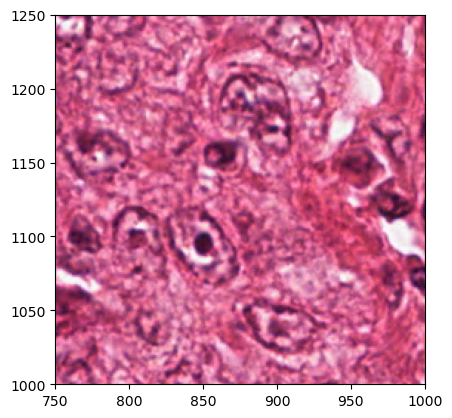

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread
%matplotlib inline

im = imread('mitosis.bmp')

plt.figure()
plt.imshow(im)
plt.xlim([750,1000])
plt.ylim([1000,1250])
plt.show()

<Figure size 640x480 with 0 Axes>

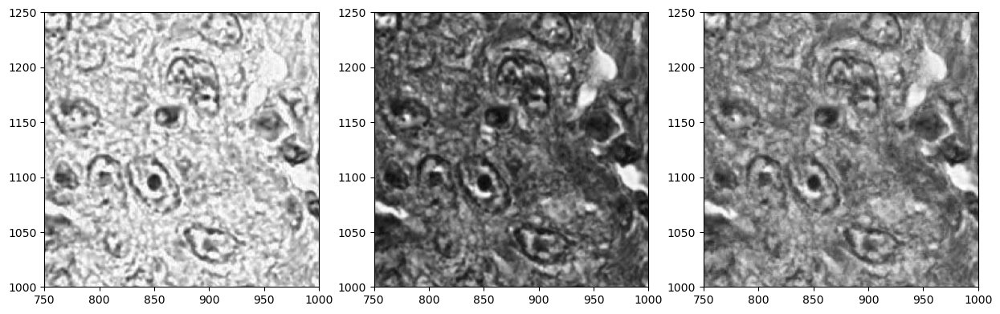

In [3]:
## -- Your code here -- ##
# Separated R, G, B channels 
plt.gray()
plt.figure(figsize=(15, 5))

#R -> not bad to detect nucleus
plt.subplot(1, 3, 1)
plt.imshow(im[...,0])
plt.xlim([750,1000])
plt.ylim([1000,1250])
#G
plt.subplot(1, 3, 2)
plt.imshow(im[...,1])
plt.xlim([750,1000])
plt.ylim([1000,1250])
#B
plt.subplot(1, 3, 3)
plt.imshow(im[...,2])
plt.xlim([750,1000])
plt.ylim([1000,1250])
plt.show()

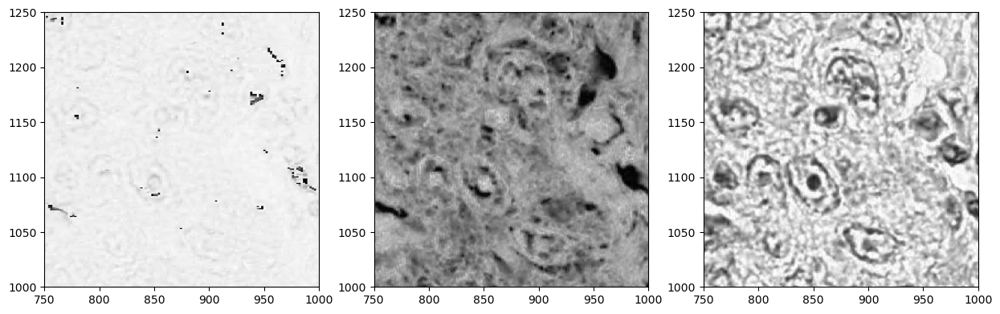

In [4]:
from skimage.color import rgb2hsv

# Same in hsv
hsv = rgb2hsv(im)
plt.figure(figsize=(15, 5))

#H (= True color, hard to interpret in this visualization)
plt.subplot(1, 3, 1)
plt.imshow(hsv[...,0])
plt.xlim([750,1000])
plt.ylim([1000,1250])
#S (=grayish or fully saturated by pigment)
plt.subplot(1, 3, 2)
plt.imshow(hsv[...,1])
plt.xlim([750,1000])
plt.ylim([1000,1250])
#V (= grayscale / lumniosity) -> Best to detect nucleus, bc the nucleus is almost always darker than other tissues
plt.subplot(1, 3, 3)
plt.imshow(hsv[...,2])
plt.xlim([750,1000])
plt.ylim([1000,1250])
plt.show()

In [ ]:
# Method 1 : Blobs of dark pixels
from skimage.feature import blob_log

blobs = blob_log(1-hsv[...,2], min_sigma=4, max_sigma=10, num_sigma=4, threshold=0.1) # find dark blobs (1-xxx), sigma refers to the size of the detected blobs we want to filter (ex: try minsigma=8)
print(blobs.shape) # each detected blob gives 3 values (coordinates of the centroid, and sigma values to characterize the size of the detected blob )

# Some finetuning of the parameters is always needed

(6951, 3)


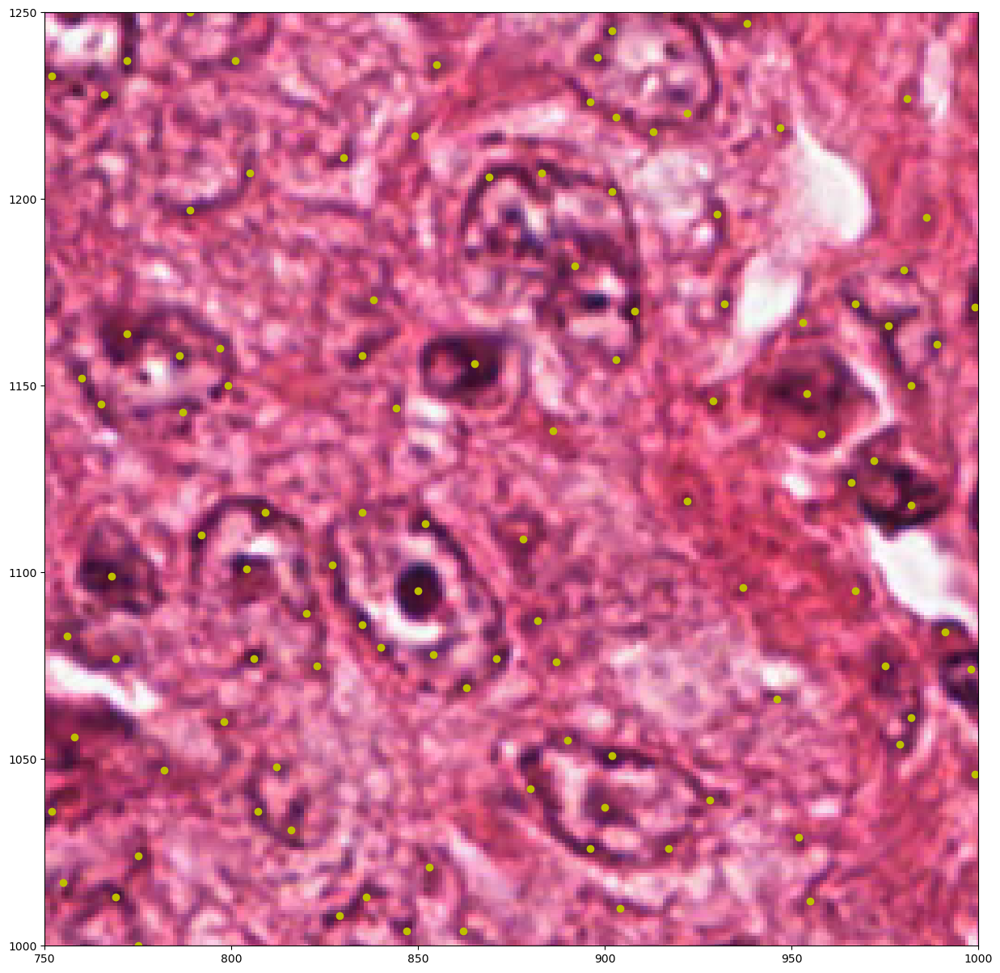

In [6]:
# plotting the centroid of each blob 
plt.figure(figsize=(15,15))
plt.imshow(im)
plt.xlim([750,1000])
plt.ylim([1000,1250])
plt.plot(blobs[:,1], blobs[:,0], 'yo', alpha=1)
plt.show()

In [12]:
# Method 2 : local minimum
from skimage.feature import peak_local_max

plm = peak_local_max(1-hsv[...,2], min_distance=15, threshold_rel=0.4) # min distance between different peaks, threshold to keep only the darker regions
print(plm.shape)

(2947, 2)


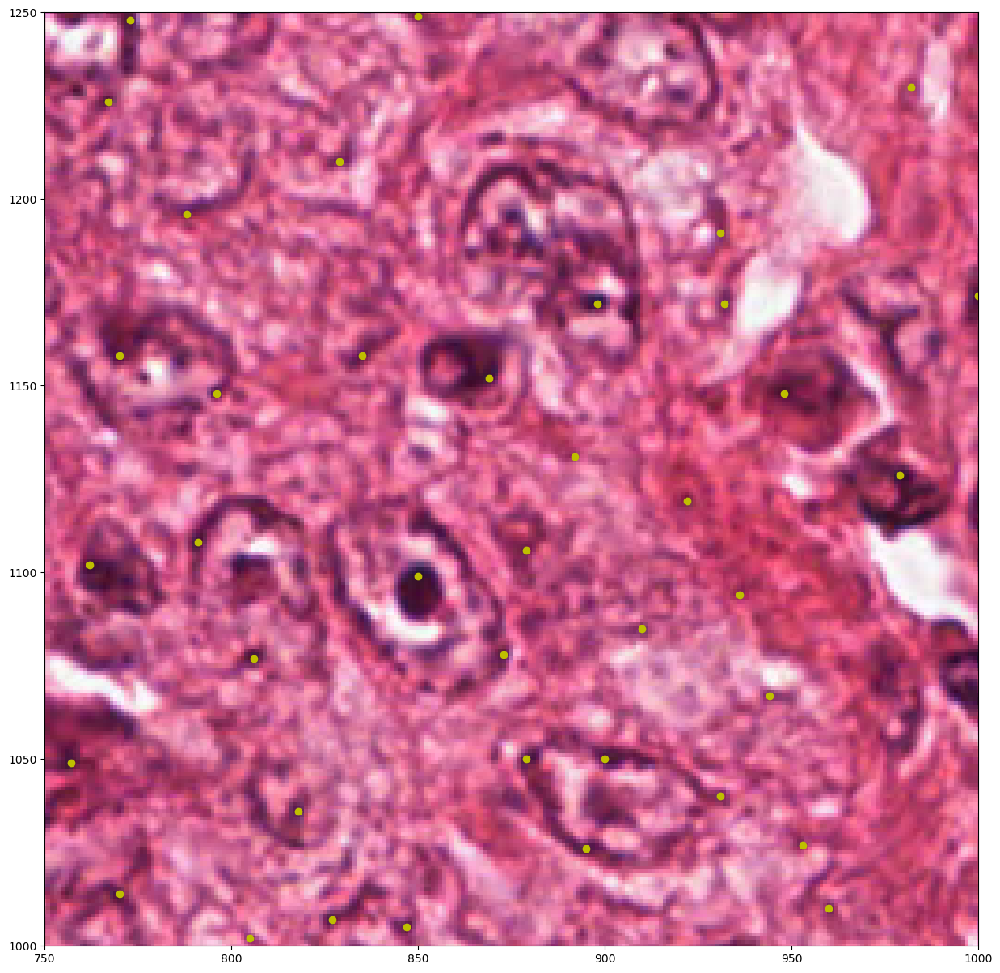

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(im)
plt.xlim([750,1000])
plt.ylim([1000,1250])
plt.plot(plm[:,1], plm[:,0], 'yo', alpha=1)
plt.show()

# Results similar to the first method

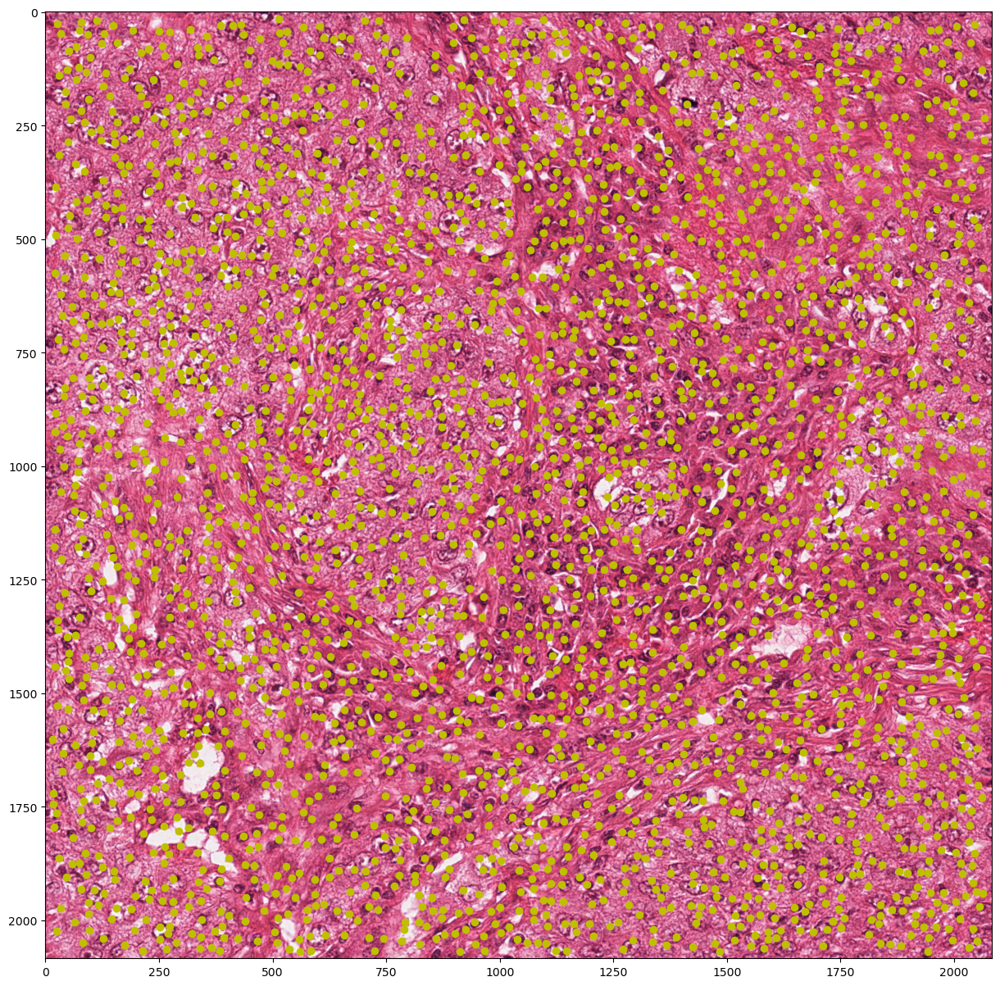

In [14]:
plt.figure(figsize=(15,15))
plt.imshow(im)
plt.plot(plm[:,1], plm[:,0], 'yo', alpha=1)
plt.show()

In [15]:
# Now we have to look at the local context of each detected point of interest using **descriptors**

## Descriptors

The goal of *descriptors* is to represent the region surrounding the point of interest in a way that allow our algorithm to best perform its task. For instance, the BRIEF descriptor will compare pairs of pixels in the given neighbourhood and create a binary descriptor representing the result of all these comparison. This kind of descriptor will tend to create a unique signature in a grayscale image, and is very useful for applications such as matching for stereo-vision or for video tracking.

Other types of descriptors can be based on the texture (for instance with local Fourier transforms) or on local histograms.

* Using the points detected before, **extract neighbourhood patches** and **compute the concatenated color histogram** as a descriptor (meaning a 256+256+256 = size 768 vector, with the first 256 values corresponding to the R histogram, etc...).
* Use the [KMeans](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html) class from `scikit-learn` to cluster the points of interest depending on their descriptor. Can you identify clusters representing the type of tissue of the cell?

In [ ]:
## -- Your code here -- ##
from sklearn.cluster import KMeans

def compute_histogram(patch):
    # 256 grayscale values X 3 color channels = 768 features in the concatenated color histogram vector)
    rgb_histogram = np.zeros((768,))
    
    ## TODO : compute histogram ##
    for v in range(256):
        rgb_histogram[v] = (patch[...,0]==v).sum()
        rgb_histogram[v + 256] = (patch[...,1]==v).sum()
        rgb_histogram[v + 512] = (patch[...,2]==v).sum()
    
    return rgb_histogram

def extract_descriptors(im, coords, neighbourhood_size=15):
    ## TODO : extract neighbourhood patch for each point coordinate, 
    ## compute histogram and compile everything in a "descriptor matrix"

    descriptors = []
    for row, col in coords:
        region = im[row-neighbourhood_size//2:row+neighbourhood_size//2, col-neighbourhood_size//2:col+neighbourhood_size//2] # select the the 15x15 local context
        descriptors.append(compute_histogram(region))
    return np.array(descriptors)

descriptors = extract_descriptors(im, plm) # each previous detected blob now has an associated concatenated color histogram vector of its local context
print(descriptors.shape)





(2947, 768)


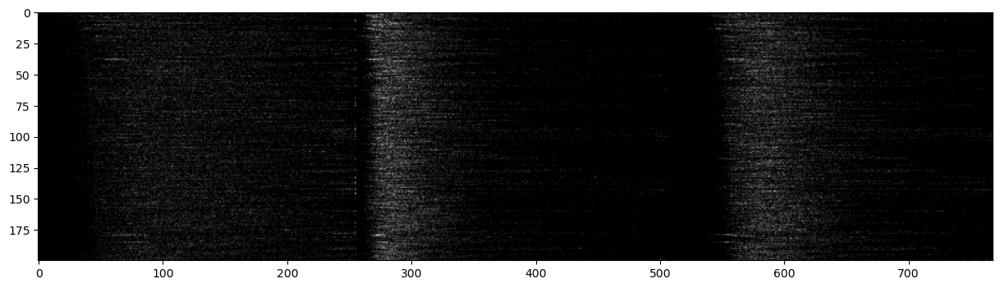

In [17]:
plt.figure(figsize=(15,15))
plt.imshow(descriptors[:200])
plt.show()

In [ ]:
# Now we will use these to make clustering

In [20]:
# Clustering
km=KMeans(n_clusters=2) # n_clusters = how many clusters I want to find in the feature space. Here we want 2 to differenciate the 2 different regions in the original slide
km.fit(descriptors)

Exception in thread Thread-20 (_readerthread):
Traceback (most recent call last):
  File "d:\anaconda3\envs\imaging\Lib\threading.py", line 1075, in _bootstrap_inner
    self.run()
  File "d:\anaconda3\envs\imaging\Lib\site-packages\ipykernel\ipkernel.py", line 772, in run_closure
    _threading_Thread_run(self)
  File "d:\anaconda3\envs\imaging\Lib\threading.py", line 1012, in run
    self._target(*self._args, **self._kwargs)
  File "d:\anaconda3\envs\imaging\Lib\subprocess.py", line 1599, in _readerthread
    buffer.append(fh.read())
                  ^^^^^^^^^
  File "<frozen codecs>", line 322, in decode
UnicodeDecodeError: 'utf-8' codec can't decode byte 0x82 in position 101: invalid start byte


,"n_clusters n_clusters: int, default=8The number of clusters to form as well as the number ofcentroids to generate.For an example of how to choose an optimal value for `n_clusters` refer to:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_silhouette_analysis.py`.",2
,"init init: {'k-means++', 'random'}, callable or array-like of shape (n_clusters, n_features), default='k-means++'Method for initialization:* 'k-means++' : selects initial cluster centroids using sampling based on an empirical probability distribution of the points' contribution to the overall inertia. This technique speeds up convergence. The algorithm implemented is ""greedy k-means++"". It differs from the vanilla k-means++ by making several trials at each sampling step and choosing the best centroid among them.* 'random': choose `n_clusters` observations (rows) at random from data for the initial centroids.* If an array is passed, it should be of shape (n_clusters, n_features) and gives the initial centers.* If a callable is passed, it should take arguments X, n_clusters and a random state and return an initialization.For an example of how to use the different `init` strategies, see:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_digits.py`.For an evaluation of the impact of initialization, see the example:ref:`sphx_glr_auto_examples_cluster_plot_kmeans_stability_low_dim_dense.py`.",'k-means++'
,"n_init n_init: 'auto' or int, default='auto'Number of times the k-means algorithm is run with different centroidseeds. The final results is the best output of `n_init` consecutive runsin terms of inertia. Several runs are recommended for sparsehigh-dimensional problems (see :ref:`kmeans_sparse_high_dim`).When `n_init='auto'`, the number of runs depends on the value of init:10 if using `init='random'` or `init` is a callable;1 if using `init='k-means++'` or `init` is an array-like... versionadded:: 1.2 Added 'auto' option for `n_init`... versionchanged:: 1.4 Default value for `n_init` changed to `'auto'`.",'auto'
,"max_iter max_iter: int, default=300Maximum number of iterations of the k-means algorithm for asingle run.",300
,"tol tol: float, default=1e-4Relative tolerance with regards to Frobenius norm of the differencein the cluster centers of two consecutive iterations to declareconvergence.",0.0001
,"verbose verbose: int, default=0Verbosity mode.",0
,"random_state random_state: int, RandomState instance or None, default=NoneDetermines random number generation for centroid initialization. Usean int to make the randomness deterministic.See :term:`Glossary `.",None
,"copy_x copy_x: bool, default=TrueWhen pre-computing distances it is more numerically accurate to centerthe data first. If copy_x is True (default), then the original data isnot modified. If False, the original data is modified, and put backbefore the function returns, but small numerical differences may beintroduced by subtracting and then adding the data mean. Note that ifthe original data is not C-contiguous, a copy will be made even ifcopy_x is False. If the original data is sparse, but not in CSR format,a copy will be made even if copy_x is False.",True
,"algorithm algorithm: {""lloyd"", ""elkan""}, default=""lloyd""K-means algorithm to use. The classical EM-style algorithm is `""lloyd""`.The `""elkan""` variation can be more efficient on some datasets withwell-defined clusters, by using the triangle inequality. However it'smore memory intensive due to the allocation of an extra array of shape`(n_samples, n_clusters)`... versionchanged:: 0.18 Added Elkan algorithm.. versionchanged:: 1.1 Renamed ""full"" to ""lloyd"", and deprecated ""auto"" and ""full"". Changed ""auto"" to use ""lloyd"" instead of ""elkan"".",'lloyd'


In [22]:
clusters = km.predict(descriptors)

In [24]:
print(clusters.shape) # 1D vector assigning a cluster to each of the previous points
print("===== Distribution per class ======")
print("cluster 0:",(clusters==0).sum(), "\ncluster 1:", (clusters==1).sum())

(2947,)
===== Distribution per class ======
cluster 0: 1667 
cluster 1: 1280


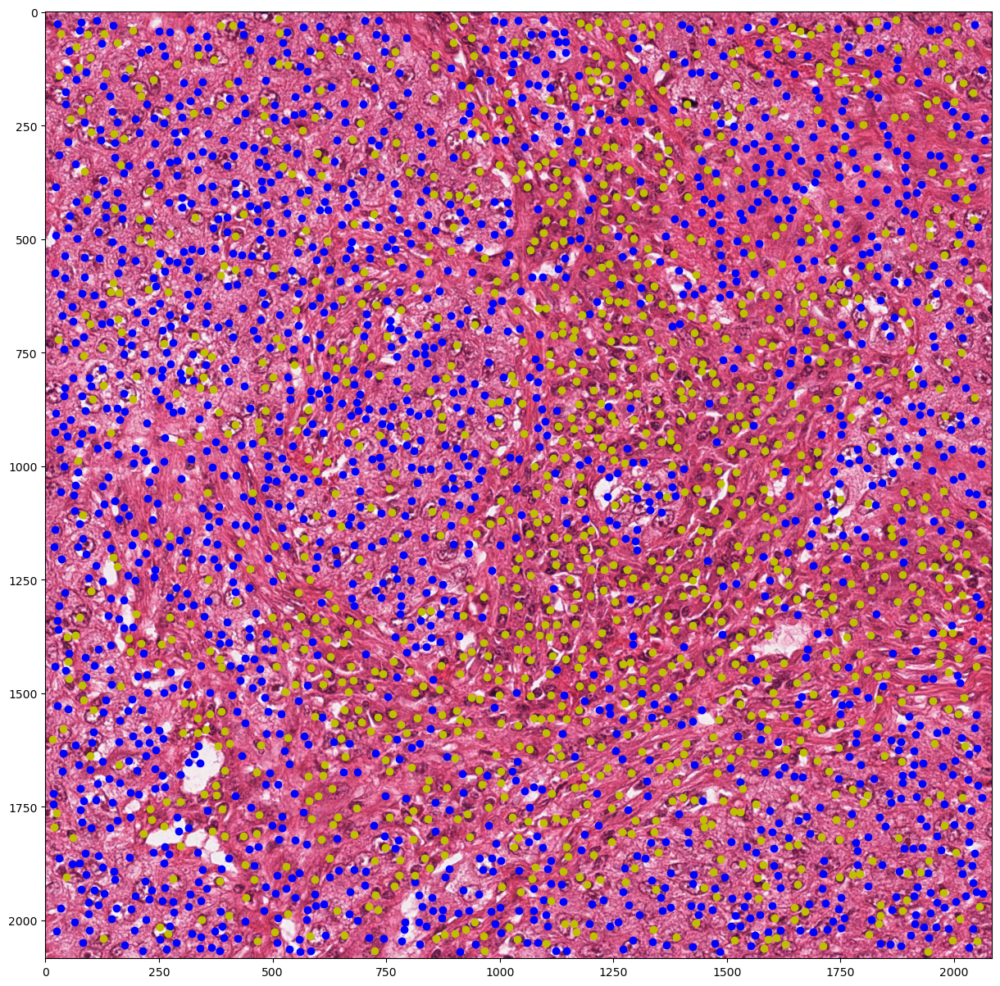

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(im)
plt.plot(plm[clusters==0, 1], plm[clusters==0, 0], "bo")
plt.plot(plm[clusters==1, 1], plm[clusters==1, 0], "yo")
plt.show()

# Very noisy, but the general idea is here.
# This is probably due to our descriptors not allowing a clean separation of the two clusters in the feature space
# solutions : find better descriptors, add information about texture, border ammount and orientation, etc. --> explore scikit image !

* Apply the same point detection and descriptors on the `mitosis2.bmp` image, and use the already trained KMeans to predict the clusters of the points in the new image.

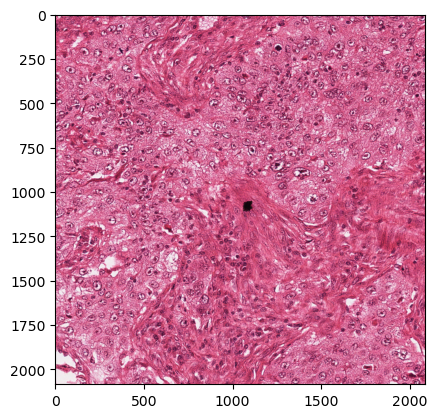

In [39]:
## -- Your code here -- ##

# Are the clusters that we found above general enough so that if we apply only the predict step on points coming from another (similar) image we get similar results/performance ?

im2 = imread("mitosis2.bmp") # same kind of tissue and microscope, so the images are similar but still different.
plt.figure()
plt.imshow(im2)
plt.show()

In [40]:
hsv2 = rgb2hsv(im2)
plm2 = peak_local_max(1-hsv2[...,2], min_distance=10, threshold_rel=0.7)
print(plm2.shape)

(1480, 2)


In [41]:
descriptors2 = extract_descriptors(im2,plm2)
print(descriptors2.shape)

(1480, 768)


In [42]:
clusters2 = km.predict(descriptors2) # reuse same km for predict without fitting

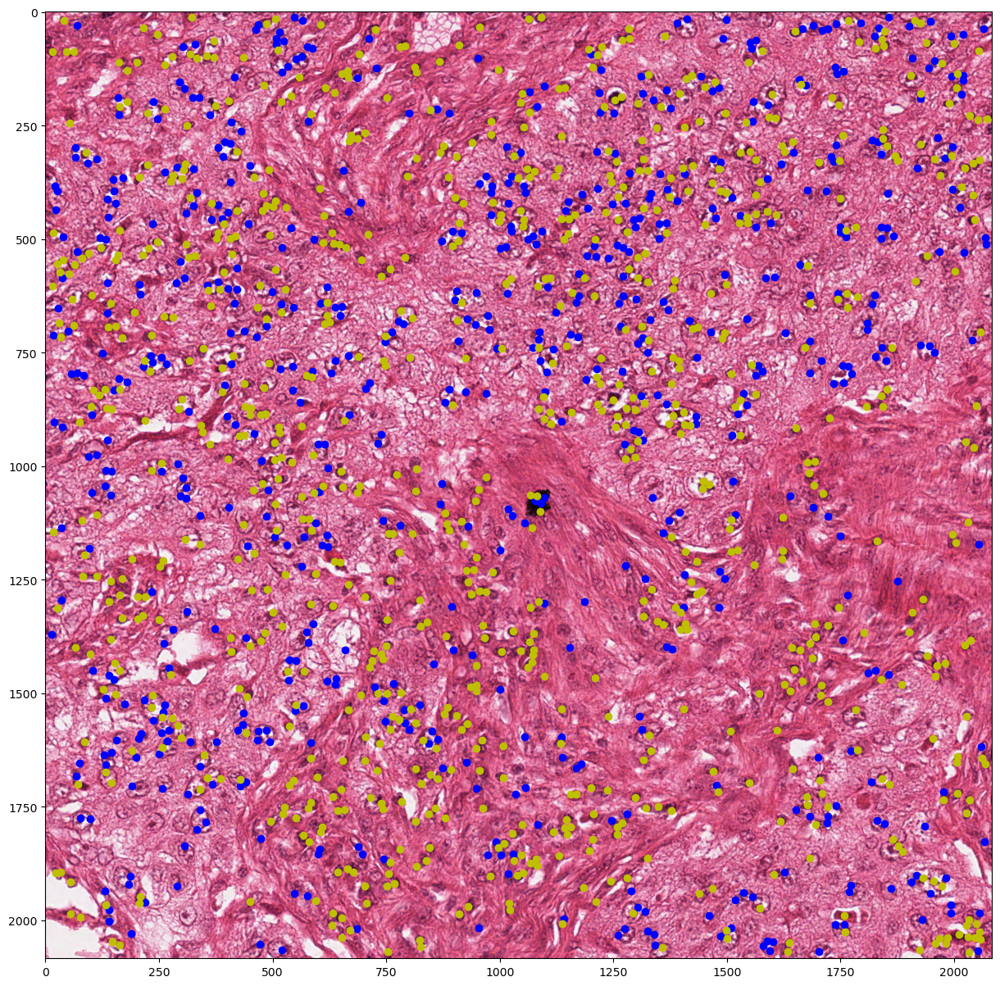

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(im2)
plt.plot(plm2[clusters2==0, 1], plm2[clusters2==0, 0], "bo")
plt.plot(plm2[clusters2==1, 1], plm2[clusters2==1, 0], "yo")
plt.show()

# Results are very far from perfect, but it seems that the largest concentration of yellow in a region and blue in another region, so it kinda works.
# The big advantage is that we have a decent performance without using unsupervised techniques.